In [1]:
import pandas as pd #the csv reading library
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns

from pylab import rcParams
from numpy import diff
from scipy import interpolate
import scipy.stats as stats

from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols

import matplotlib.gridspec as gridspec

import cmocean
import cmocean.cm as cmo
import seaborn as sns


import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

## import data

In [2]:
df_o2 = pd.read_csv('../Dissertation_projects/Data/CTD/O2_Summary_Stats.csv', sep=',', index_col=0)

In [3]:
df_meta = pd.read_csv('../Dissertation_projects/Data/meta_data.csv', sep=',', index_col=0)

#fix date time 
df_meta['date_time'] = pd.to_datetime(df_meta['Date'])
df_meta['Date'] = df_meta['date_time'].dt.date

df_meta['code'] = df_meta['Station'] + '_' + df_meta['Trip']

In [4]:
df_por = pd.read_csv('../Dissertation_projects/Data/Porosity/Porosity.csv', sep=',', index_col = 0)
df_por['code'] = df_por['Stn'] + '_' + df_por['camp']

In [5]:
df_hights = pd.read_csv('../Dissertation_projects/Data/Hights.csv', sep=',')

df_hights['code'] = df_hights['Stn'] + '_' + df_hights['Camp']
#df_hights.drop("Stn", axis=1, inplace=True)
#df_hights.drop("Camp", axis=1, inplace=True)
df_hights.index = df_hights['code']
df_hights.drop("code", axis=1, inplace=True)

In [6]:
PW_CDOM_data = '../Dissertation_projects/Data/CDOM/Outputs.csv'

df = pd.read_csv(PW_CDOM_data, sep=',', index_col=0)
df = pd.DataFrame(df)

df.index = df.index.astype(str)
df_meta.index = df_meta.index.astype(str)

#df.columns = ['a' + col for col in df.columns]
df_cdom = df.join(df_meta, how='inner')

#df_cdom['file_id'] = df_cdom['afile_id']
#df_cdom = df_cdom.drop('afile_id', axis = 1)
#df_cdom = df_cdom.drop('224946')
df_cdom = df_cdom[df_cdom['Type'] == 'LANDSYR']

df_cdom.to_csv('../Dissertation_projects/CDOM_Tracer_and_Proxy_Project/Outputs_mata_Jan_2025.csv')
df_cdom

,ss_275_700_sem,ss_275_295_sem,ss_350_400_sem,R2_275_700_sem,R2_275_295_sem,R2_350_400_sem,SR_sem,ss_275_700_hm,ss_275_295_hm,ss_350_400_hm,...,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time,code
Sample_ID,,,,,,,,,,,,,,,,,,,,,
212841,0.001834,-0.000023,0.000010,0.305639,0.943013,0.152900,-2.274347,0.000331,-0.006280,0.004274,...,NaN,0.200000,0.049951,LANDSYR,NaN,BC1,NaN,34.931789,2021-07-26,St.11_GOM2021
212842,0.000907,0.019669,0.076550,0.243833,0.978658,0.066023,0.256947,0.000270,-0.005062,27.194942,...,NaN,2.116670,0.049951,LANDSYR,NaN,BC2,NaN,34.931789,2021-07-26,St.11_GOM2021
212843,0.001261,0.007845,0.065689,0.261506,0.961288,0.073936,0.119433,0.000315,-0.015135,-0.001902,...,NaN,4.033330,0.049951,LANDSYR,NaN,BC3,NaN,34.931789,2021-07-26,St.11_GOM2021
212844,0.000969,0.021487,0.057443,0.231947,0.975402,0.147222,0.374059,0.000244,-0.004843,-0.001925,...,NaN,5.950000,0.049951,LANDSYR,NaN,BC4,NaN,34.931789,2021-07-26,St.11_GOM2021
212845,0.000719,0.021273,0.045298,0.217324,0.976664,0.281609,0.469633,0.000305,-0.005349,-0.001881,...,NaN,7.866670,0.049951,LANDSYR,NaN,BC5,NaN,34.931789,2021-07-26,St.11_GOM2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225357,0.023852,0.006418,0.020430,0.997398,0.999829,0.999178,0.314157,7.333272,0.829519,6.611881,...,0.489,12.466667,0.053721,LANDSYR,LWCC 50 CM #2,BC17,NaN,36.007597,2022-07-24,St.MK_GOM22SU
225357,0.023849,0.006760,0.020538,0.997366,0.999826,0.999231,0.329166,7.332243,0.926534,6.650943,...,0.489,12.466667,0.053721,LANDSYR,LWCC 50 CM #2,BC17,NaN,36.007597,2022-07-24,St.MK_GOM22SU
225358,0.025217,0.004569,0.021723,0.997811,0.999845,0.999368,0.210311,7.739632,0.299584,-0.001022,...,0.489,13.233333,0.053721,LANDSYR,LWCC 50 CM #2,BC18,NaN,36.007597,2022-07-24,St.MK_GOM22SU


## Data for flux calculations 

In [7]:
PW_CDOM_data = '../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_BC.csv'

df = pd.read_csv(PW_CDOM_data, sep=',', index_col=0)
df = pd.DataFrame(df)

df.index = df.index.astype(str)
df_meta.index = df_meta.index.astype(str)

df.columns = ['a' + col for col in df.columns]

df_cdom = df.join(df_meta, how='inner')

df_cdom['file_id'] = df_cdom['afile_id']
df_cdom = df_cdom.drop('afile_id', axis = 1)

df_cdom['Samp_ID'] = df_cdom.index


doc_ds = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)
doc_ds = doc_ds[doc_ds['Type'] == "BC"]
doc_ds.index = doc_ds.index.astype(str)
doc_ds_ = doc_ds['NPOC_uM'] 
doc_ds_std = doc_ds['NPOC_uM_std'] 

df_cdom['NPOC_uM'] = doc_ds_
df_cdom['NPOC_uM_std'] = doc_ds_std

df_cdom['SUVA'] = df_cdom['a254'] / (df_cdom['NPOC_uM'] * 0.012) 

df_cdom = df_cdom[df_cdom["a350"] >= 0]  #mostly bad scanns with cdom less then one 
df_cdom = df_cdom[df_cdom["a350"] <= 2] #mostly bad scanns with very high scanns 
df_cdom = df_cdom[df_cdom["a450"] >= df_cdom["a500"]] # bad scanns with dirty blanks

df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID211940_Absorbance_23-33-51-569']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != '225250_0_27']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != '225250_1_28']  #bad scann

df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID212741_Absorbance_13-25-36-247'] #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID212742_Absorbance_13-27-35-331']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID212748_Absorbance_13-40-03-894']  #bad scann

df_cdom = df_cdom[df_cdom['file_id'] != '221756_0_12']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != '221756_1_13']  #bad scann

df_cdom = df_cdom[df_cdom['code'] != 'St.4_GOM2021'] #BC notes hight
#df_cdom = df_cdom[df_cdom['code'] != 'St.5B_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.7_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.MK_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.MK_GOM21FA'] #BC notes hight
#df_cdom = df_cdom[df_cdom['code'] != 'St.5B_GOM22SU'] #BC notes hight

#df_cdom = df_cdom[df_cdom['code'] != 'St.5B_GOM22SU'] #Chamber may have not locked, lander was sideways upon recovery
df_cdom = df_cdom[df_cdom['code'] != 'St.13_GOM22SP'] #Only 3 sample 

df_cdom = df_cdom[df_cdom['code'] != 'St.14_GOM2021'] #no samples left post cleaning
#df_cdom = df_cdom[df_cdom['code'] != 'St.12_GOM22SU'] #Only 3 samples left after dirty blank removal  


#Sampling tubing may have disconnected on odd rack syringes 
df_cdom = df_cdom[~df_cdom['Samp_ID'].isin(['224242', '224244', '224246', '224248', '224250', '224252', '224254', '224256', '224258'])]

#taken out when looking at spectra - spectra were off in some way 
df_cdom = df_cdom[~df_cdom['Samp_ID'].isin(['224656','224956','224947','221454','221448'])]

subset_df = df_cdom[(df_cdom['Trip'] == 'GOM22SP') & (df_cdom['Station'] == 'St.5B')]
#subset_df = df_cdom[df_cdom['Samp_ID'] == '225250']


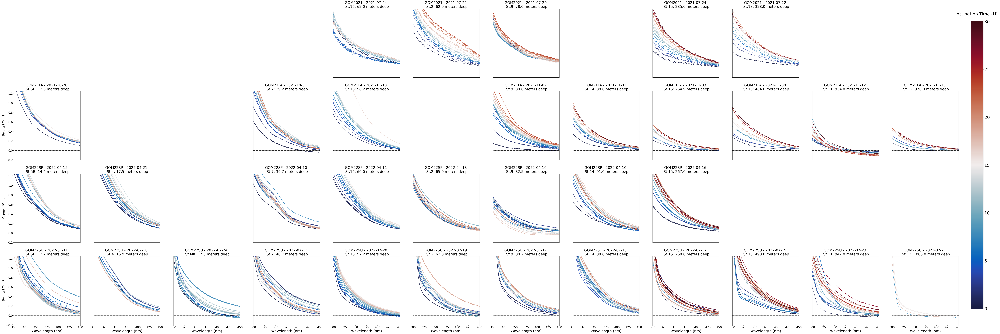

In [8]:
#Setup colormap and CDOM Spectra 
trips = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

wavelengths = list(range(250, 751))


fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*10))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.balance
                norm = plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, cdom_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-.2,1.25)
            axes[i,j].set_xlim(300,450)
            axes[i, j].axhline(y=0, color='black', linestyle='--', linewidth=1)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.balance, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.show()

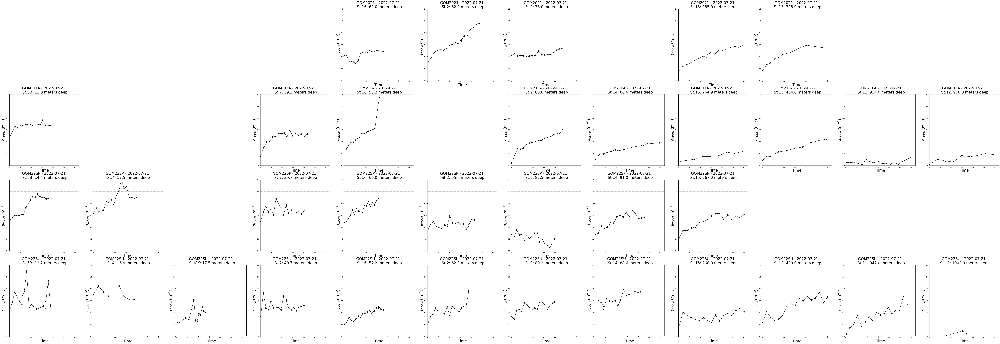

In [9]:
#Setup colormap and CDOM Spectra 
trips = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

wavelengths = list(range(250, 751))


fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*10))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        subset_df = subset_df.sort_values('BC_time')
        
        if not subset_df.empty:
            axes[i, j].plot(subset_df["BC_time"], subset_df["a350"], color='black', marker = 'o')

            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].set_xlabel('Time', size=25, c='black')
            axes[i,j].set_xlim(0,32)
            axes[i,j].set_ylim(-0,1.2)
            
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
            axes[i, j].axhline(y=1, color='black', linestyle='--', linewidth=1)
            plotted = False
        else: 
            axes[i, j].axis('off')
            

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.show()

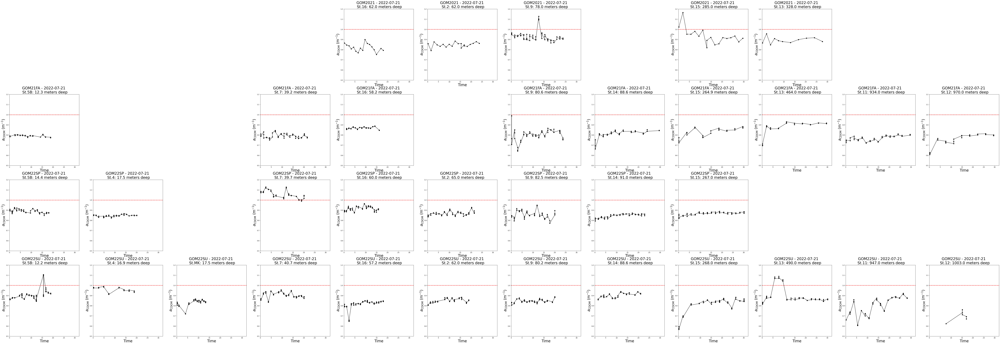

In [10]:
#Setup colormap and CDOM Spectra 
trips = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

wavelengths = list(range(250, 751))


fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*10))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        subset_df = subset_df.sort_values('BC_time')

        subset_df["a350_norm"] = (subset_df["a350"] - subset_df["a400"]) / (subset_df["a300"] - subset_df["a400"])
        subset_df["a325_norm"] = (subset_df["a325"] - subset_df["a400"]) / (subset_df["a300"] - subset_df["a400"])
        subset_df["a375_norm"] = (subset_df["a375"] - subset_df["a400"]) / (subset_df["a300"] - subset_df["a400"])
        subset_df["a_infelc"] = subset_df["a350_norm"] / ((subset_df["a325_norm"] + subset_df["a375_norm"])/2)
        
        if not subset_df.empty:
            axes[i, j].plot(subset_df["BC_time"], subset_df["a_infelc"], color='black', marker = 'o')

            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].set_xlabel('Time', size=25, c='black')
            axes[i,j].set_xlim(0,32)
            axes[i,j].set_ylim(.5,1.2)
            
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
            axes[i, j].axhline(y=1, color='red', linestyle='--', linewidth=2)
            plotted = False
        else: 
            axes[i, j].axis('off')
            

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.show()

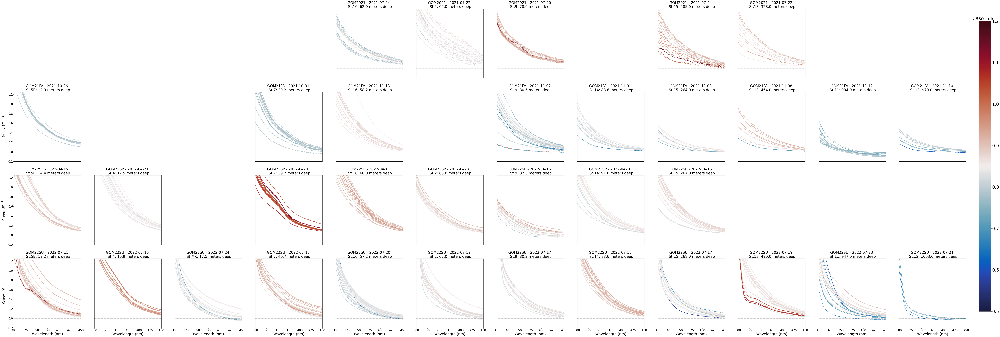

In [11]:
#Setup colormap and CDOM Spectra 
trips = ['GOM2021','GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

wavelengths = list(range(250, 751))

df_cdom["a350_norm"] = (df_cdom["a350"] - df_cdom["a400"]) / (df_cdom["a300"] - df_cdom["a400"])
df_cdom["a325_norm"] = (df_cdom["a325"] - df_cdom["a400"]) / (df_cdom["a300"] - df_cdom["a400"])
df_cdom["a375_norm"] = (df_cdom["a375"] - df_cdom["a400"]) / (df_cdom["a300"] - df_cdom["a400"])
df_cdom["a_infelc"] = df_cdom["a350_norm"] / ((df_cdom["a325_norm"] + df_cdom["a375_norm"])/2)

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*10))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.balance
                norm = plt.Normalize(vmin=.5, vmax=1.2)
                color = cmap(norm(row["a_infelc"]))
                axes[i, j].plot(wavelengths, cdom_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-.2,1.25)
            axes[i,j].set_xlim(300,450)
            axes[i, j].axhline(y=0, color='black', linestyle='--', linewidth=1)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.balance, norm=plt.Normalize(vmin=.5, vmax=1.2)), cax=cbar_ax)
cbar.ax.set_title(f'a350 inflec', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.show()

In [12]:
PW_CDOM_data = '../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_BC.csv'

df = pd.read_csv(PW_CDOM_data, sep=',', index_col=0)
df = pd.DataFrame(df)

df.index = df.index.astype(str)
df_meta.index = df_meta.index.astype(str)

df.columns = ['a' + col for col in df.columns]

df_cdom = df.join(df_meta, how='inner')

df_cdom['file_id'] = df_cdom['afile_id']
df_cdom = df_cdom.drop('afile_id', axis = 1)

df_cdom['Samp_ID'] = df_cdom.index


doc_ds = pd.read_csv('../Dissertation_projects/Data/TOC/TOC_GOM.csv', sep=',', index_col=0)
doc_ds = doc_ds[doc_ds['Type'] == "BC"]
doc_ds.index = doc_ds.index.astype(str)
doc_ds_ = doc_ds['NPOC_uM'] 
doc_ds_std = doc_ds['NPOC_uM_std'] 

df_cdom['NPOC_uM'] = doc_ds_
df_cdom['NPOC_uM_std'] = doc_ds_std

df_cdom['SUVA'] = df_cdom['a254'] / (df_cdom['NPOC_uM'] * 0.012) 

df_cdom = df_cdom[df_cdom["a350"] >= 0]  #mostly bad scanns with cdom less then one 
df_cdom = df_cdom[df_cdom["a350"] <= 2] #mostly bad scanns with very high scanns 
df_cdom = df_cdom[df_cdom["a450"] >= df_cdom["a500"]] # bad scanns with dirty blanks

df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID211940_Absorbance_23-33-51-569']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != '225250_0_27']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != '225250_1_28']  #bad scann

df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID212741_Absorbance_13-25-36-247'] #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID212742_Absorbance_13-27-35-331']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != 'BC_Abs_GoM21Su_ID212748_Absorbance_13-40-03-894']  #bad scann

df_cdom = df_cdom[df_cdom['file_id'] != '221756_0_12']  #bad scann
df_cdom = df_cdom[df_cdom['file_id'] != '221756_1_13']  #bad scann

df_cdom = df_cdom[df_cdom['code'] != 'St.4_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.5B_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.7_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.MK_GOM2021'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.MK_GOM21FA'] #BC notes hight
df_cdom = df_cdom[df_cdom['code'] != 'St.5B_GOM22SU'] #BC notes hight

df_cdom = df_cdom[df_cdom['code'] != 'St.5B_GOM22SU'] #Chamber may have not locked, lander was sideways upon recovery
df_cdom = df_cdom[df_cdom['code'] != 'St.13_GOM22SP'] #Only 3 sample 

df_cdom = df_cdom[df_cdom['code'] != 'St.14_GOM2021'] #no samples left post cleaning
df_cdom = df_cdom[df_cdom['code'] != 'St.12_GOM22SU'] #Only 3 samples left after dirty blank removal  


#Sampling tubing may have disconnected on odd rack syringes 
df_cdom = df_cdom[~df_cdom['Samp_ID'].isin(['224242', '224244', '224246', '224248', '224250', '224252', '224254', '224256', '224258'])]

#taken out when looking at spectra - spectra were off in some way 
df_cdom = df_cdom[~df_cdom['Samp_ID'].isin(['224656','224956','224947','221454','221448'])]

subset_df = df_cdom[(df_cdom['Trip'] == 'GOM22SP') & (df_cdom['Station'] == 'St.5B')]
#subset_df = df_cdom[df_cdom['Samp_ID'] == '225250']

df_cdom['code'].unique()

array(['St.13_GOM2021', 'St.15_GOM2021', 'St.16_GOM2021', 'St.2_GOM2021',
       'St.9_GOM2021', 'St.11_GOM21FA', 'St.12_GOM21FA', 'St.13_GOM21FA',
       'St.14_GOM21FA', 'St.15_GOM21FA', 'St.16_GOM21FA', 'St.5B_GOM21FA',
       'St.7_GOM21FA', 'St.9_GOM21FA', 'St.14_GOM22SP', 'St.15_GOM22SP',
       'St.16_GOM22SP', 'St.2_GOM22SP', 'St.4_GOM22SP', 'St.5B_GOM22SP',
       'St.7_GOM22SP', 'St.9_GOM22SP', 'St.MK_GOM22SU', 'St.11_GOM22SU',
       'St.13_GOM22SU', 'St.14_GOM22SU', 'St.15_GOM22SU', 'St.16_GOM22SU',
       'St.2_GOM22SU', 'St.4_GOM22SU', 'St.7_GOM22SU', 'St.9_GOM22SU'],
      dtype=object)

In [13]:
#hights data
df_hights = pd.read_csv('../Dissertation_projects/Data/Hights.csv', sep=',')

df_hights['code'] = df_hights['Stn'] + '_' + df_hights['Camp']
#df_hights.drop("Stn", axis=1, inplace=True)
#df_hights.drop("Camp", axis=1, inplace=True)
df_hights.index = df_hights['code']
df_hights.drop("code", axis=1, inplace=True)

In [14]:
#location data 
df_lat_lon = df_meta.groupby('code').agg({'Lat': 'mean', 'Lon': 'mean'}).reset_index().set_index('code')

## slope calculations

#figure calculate pore water 

#CDOM slopes
df_cdom = df_cdom[df_cdom['Type'] == "LANDSYR"]
df_cdom = df_cdom.sort_values(by='code')
codes = df_cdom['code'].unique()

print(codes)
len(codes)

# slopes Calculate 
Frames = []

def cdom_bc_cal(code, time): 
    ds = df_cdom[df_cdom['code'] == code]
    
    ds_cut = ds[ds['BC_time'] <= time]

    x = ds_cut['BC_time'].ravel()
    y = ds_cut['SUVA'].ravel()
    
    # Calculate the slope of the regression line
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
        dic = {'code':[code],
               'slope_412':[slope],
               'rsquared_412':[rsquared], 
               'std_err_412':[std_err]}
    
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)

        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2)) 
        axs.plot(x, intercept + slope * x, c='y')     
        axs.scatter(ds['BC_time'], ds['SUVA'], c="black")
        axs.set_ylabel('a CDOM 412')
        axs.set_xlabel('time')
        fig.suptitle(code)
        Frames.append(slopes)


cdom_bc_cal('St.11_GOM2021', 20)
cdom_bc_cal('St.11_GOM21FA', 6)
cdom_bc_cal('St.11_GOM22SU', 15)
cdom_bc_cal('St.12_GOM21FA', 12) ########
cdom_bc_cal('St.12_GOM22SU', 10) ########
cdom_bc_cal('St.13_GOM2021', 6)
cdom_bc_cal('St.13_GOM21FA', 20) ########
cdom_bc_cal('St.13_GOM22SP', 6)
cdom_bc_cal('St.13_GOM22SU', 12)#########
cdom_bc_cal('St.14_GOM2021', 10) ## this one is gone? ###
cdom_bc_cal('St.14_GOM21FA', 10) ###########
cdom_bc_cal('St.14_GOM22SP', 10) #######
cdom_bc_cal('St.14_GOM22SU', 12)
cdom_bc_cal('St.15_GOM2021', 15)
cdom_bc_cal('St.15_GOM21FA', 12) ##########
cdom_bc_cal('St.15_GOM22SP', 15)
cdom_bc_cal('St.15_GOM22SU', 12)
cdom_bc_cal('St.16_GOM2021', 16)
cdom_bc_cal('St.16_GOM21FA', 15)
cdom_bc_cal('St.16_GOM22SP', 6) ########
cdom_bc_cal('St.16_GOM22SU', 12)
cdom_bc_cal('St.2_GOM2021', 12)
cdom_bc_cal('St.2_GOM22SP', 10) ###########
cdom_bc_cal('St.2_GOM22SU', 7)
cdom_bc_cal('St.4_GOM22SP', 13)
cdom_bc_cal('St.4_GOM22SU', 4)
cdom_bc_cal('St.5B_GOM2021', 6)
cdom_bc_cal('St.5B_GOM21FA', 5)
cdom_bc_cal('St.5B_GOM22SP', 9)
cdom_bc_cal('St.5B_GOM22SU', 7)
cdom_bc_cal('St.7_GOM2021', 10)
cdom_bc_cal('St.7_GOM21FA', 6) ############
cdom_bc_cal('St.7_GOM22SP', 6.5)
cdom_bc_cal('St.7_GOM22SU', 10) ##########
cdom_bc_cal('St.9_GOM2021', 12)
cdom_bc_cal('St.9_GOM21FA', 15)
cdom_bc_cal('St.9_GOM22SP', 10) ###########
cdom_bc_cal('St.9_GOM22SU', 10)
cdom_bc_cal('St.MK_GOM2021', 10)
cdom_bc_cal('St.MK_GOM21FA', 10)
cdom_bc_cal('St.MK_GOM22SU', 4)


In [15]:
df_cdom['code'].unique()

array(['St.13_GOM2021', 'St.15_GOM2021', 'St.16_GOM2021', 'St.2_GOM2021',
       'St.9_GOM2021', 'St.11_GOM21FA', 'St.12_GOM21FA', 'St.13_GOM21FA',
       'St.14_GOM21FA', 'St.15_GOM21FA', 'St.16_GOM21FA', 'St.5B_GOM21FA',
       'St.7_GOM21FA', 'St.9_GOM21FA', 'St.14_GOM22SP', 'St.15_GOM22SP',
       'St.16_GOM22SP', 'St.2_GOM22SP', 'St.4_GOM22SP', 'St.5B_GOM22SP',
       'St.7_GOM22SP', 'St.9_GOM22SP', 'St.MK_GOM22SU', 'St.11_GOM22SU',
       'St.13_GOM22SU', 'St.14_GOM22SU', 'St.15_GOM22SU', 'St.16_GOM22SU',
       'St.2_GOM22SU', 'St.4_GOM22SU', 'St.7_GOM22SU', 'St.9_GOM22SU'],
      dtype=object)

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\142097433.py:9: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  x = ds_cut['BC_time'].ravel()
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\142097433.py:10: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  y = ds_cut['a412'].ravel()
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\142097433.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2))


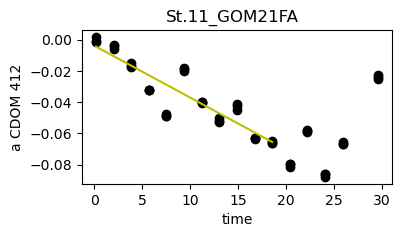

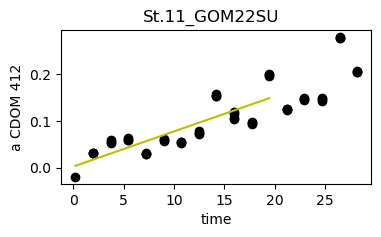

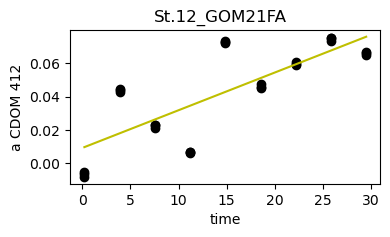

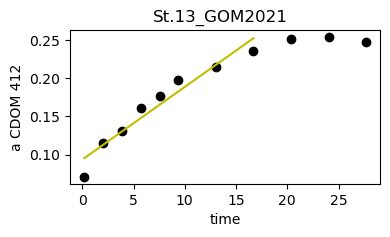

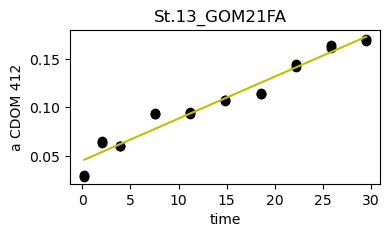

...

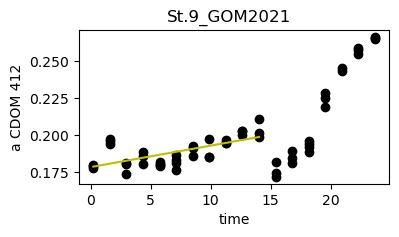

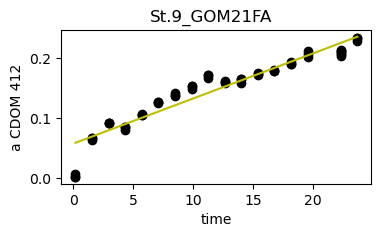

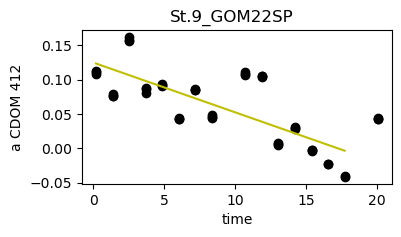

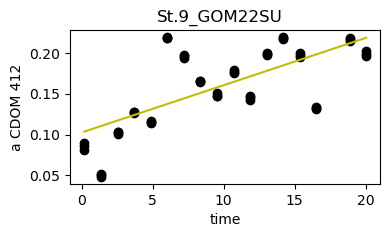

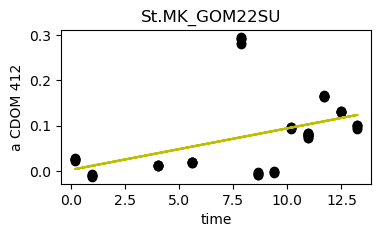

In [16]:
# slopes Calculate 
Frames = []

def cdom_bc_cal(code, time): 
    ds = df_cdom[df_cdom['code'] == code]
    
    ds_cut = ds[ds['BC_time'] <= time]

    x = ds_cut['BC_time'].ravel()
    y = ds_cut['a412'].ravel()
    
    # Calculate the slope of the regression line
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
        dic = {'code':[code],
               'slope_412':[slope],
               'rsquared_412':[rsquared], 
               'std_err_412':[std_err]}
    
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)

        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2)) 
        axs.plot(x, intercept + slope * x, c='y')     
        axs.scatter(ds['BC_time'], ds['a412'], c="black")
        axs.set_ylabel('a CDOM 412')
        axs.set_xlabel('time')
        fig.suptitle(code)
        #axs.set_ylim(15,-1)
        #axs.set_xlim(df_cdom['a350'].min(),sub['a350'].max()*1.1)
    
        Frames.append(slopes)

cdom_bc_cal('St.11_GOM21FA', 20)
cdom_bc_cal('St.11_GOM22SU', 20)
cdom_bc_cal('St.12_GOM21FA', 30)
cdom_bc_cal('St.13_GOM2021', 20)
cdom_bc_cal('St.13_GOM21FA', 30)
cdom_bc_cal('St.13_GOM22SU', 20)
cdom_bc_cal('St.14_GOM21FA', 30)
cdom_bc_cal('St.14_GOM22SP', 20)
cdom_bc_cal('St.14_GOM22SU', 25)
cdom_bc_cal('St.15_GOM2021', 24)
cdom_bc_cal('St.15_GOM21FA', 20)
cdom_bc_cal('St.15_GOM22SP', 20)
cdom_bc_cal('St.15_GOM22SU', 33)
cdom_bc_cal('St.16_GOM2021', 20)
cdom_bc_cal('St.16_GOM21FA', 15)
cdom_bc_cal('St.16_GOM22SP', 20)
cdom_bc_cal('St.16_GOM22SU', 16)
cdom_bc_cal('St.2_GOM2021', 25)
cdom_bc_cal('St.2_GOM22SP', 20)
cdom_bc_cal('St.2_GOM22SU', 20)
cdom_bc_cal('St.4_GOM22SP', 16)
cdom_bc_cal('St.4_GOM22SU', 20)
cdom_bc_cal('St.5B_GOM21FA', 14)
cdom_bc_cal('St.5B_GOM22SP', 15)
cdom_bc_cal('St.7_GOM21FA', 10)
cdom_bc_cal('St.7_GOM22SP', 25)
cdom_bc_cal('St.7_GOM22SU', 20)
cdom_bc_cal('St.9_GOM2021', 15)
cdom_bc_cal('St.9_GOM21FA', 27)
cdom_bc_cal('St.9_GOM22SP', 18)
cdom_bc_cal('St.9_GOM22SU', 22)
cdom_bc_cal('St.MK_GOM22SU', 15)



In [17]:
slopes_412 = pd.concat(Frames, axis=0, ignore_index=False)
slopes_412 = slopes_412.dropna()
slopes_412

#filtered_slopes_412 = slopes_412[abs(slopes_412['slope_412']) >= slopes_412['std_err_412']]
#filtered_slopes_412

,slope_412,rsquared_412,std_err_412
code,,,
St.11_GOM21FA,-0.003327,0.814402,0.000285
St.11_GOM22SU,0.007516,0.689335,0.000878
St.12_GOM21FA,0.002252,0.596270,0.000371
St.13_GOM2021,0.009504,0.933996,0.001031
St.13_GOM21FA,0.004341,0.955875,0.000176
St.13_GOM22SU,0.005161,0.458326,0.001008
St.14_GOM21FA,0.002859,0.914908,0.000143
St.14_GOM22SP,0.007108,0.689556,0.000703
St.14_GOM22SU,0.002667,0.159173,0.000904


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\1877445895.py:9: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  x = ds_cut['BC_time'].ravel()
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\1877445895.py:10: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  y = ds_cut['a350'].ravel()
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\1877445895.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2))


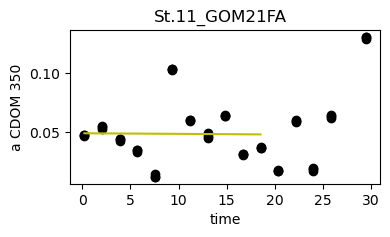

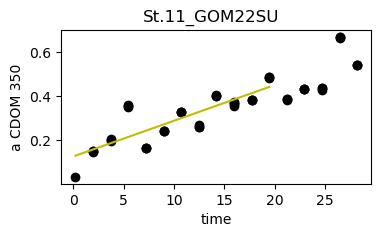

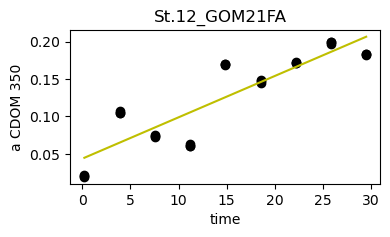

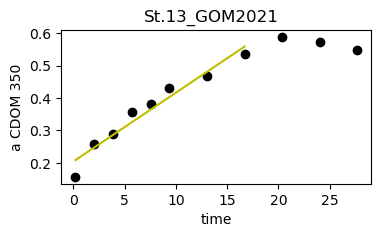

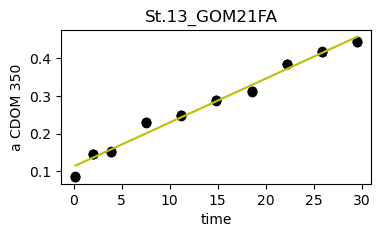

...

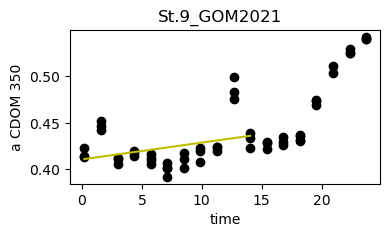

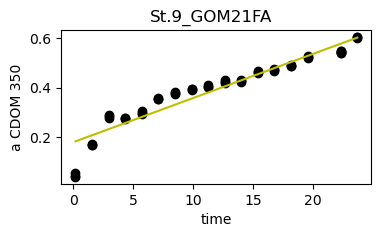

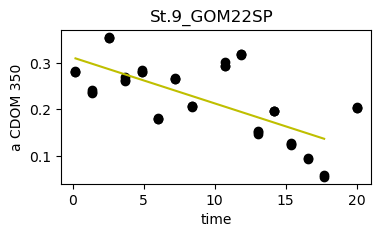

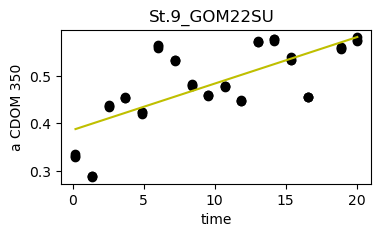

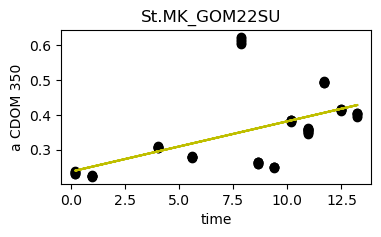

In [18]:
# slopes Calculate 
Frames = []

def cdom_bc_cal(code, time): 
    ds = df_cdom[df_cdom['code'] == code]

    ds_cut = ds[ds['BC_time'] <= time]
    
    x = ds_cut['BC_time'].ravel()
    y = ds_cut['a350'].ravel()
    
    # Calculate the slope of the regression line
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
        dic = {'code':[code],
               'slope_350':[slope],
               'rsquared_350':[rsquared], 
               'std_err_350':[std_err]}
    
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)

        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2)) 
        axs.plot(x, intercept + slope * x, c='y')     
        axs.scatter(ds['BC_time'], ds['a350'], c="black")
        axs.set_ylabel('a CDOM 350')
        axs.set_xlabel('time')
        fig.suptitle(code)
        #axs.set_ylim(15,-1)
        #axs.set_xlim(df_cdom['a350'].min(),sub['a350'].max()*1.1)
    
        Frames.append(slopes)

cdom_bc_cal('St.11_GOM21FA', 20)
cdom_bc_cal('St.11_GOM22SU', 20)
cdom_bc_cal('St.12_GOM21FA', 30)
cdom_bc_cal('St.13_GOM2021', 20)
cdom_bc_cal('St.13_GOM21FA', 30)
cdom_bc_cal('St.13_GOM22SU', 20)
cdom_bc_cal('St.14_GOM21FA', 30)
cdom_bc_cal('St.14_GOM22SP', 20)
cdom_bc_cal('St.14_GOM22SU', 25)
cdom_bc_cal('St.15_GOM2021', 24)
cdom_bc_cal('St.15_GOM21FA', 20)
cdom_bc_cal('St.15_GOM22SP', 20)
cdom_bc_cal('St.15_GOM22SU', 33)
cdom_bc_cal('St.16_GOM2021', 20)
cdom_bc_cal('St.16_GOM21FA', 15)
cdom_bc_cal('St.16_GOM22SP', 20)
cdom_bc_cal('St.16_GOM22SU', 16)
cdom_bc_cal('St.2_GOM2021', 25)
cdom_bc_cal('St.2_GOM22SP', 20)
cdom_bc_cal('St.2_GOM22SU', 20)
cdom_bc_cal('St.4_GOM22SP', 16)
cdom_bc_cal('St.4_GOM22SU', 20)
cdom_bc_cal('St.5B_GOM21FA', 14)
cdom_bc_cal('St.5B_GOM22SP', 15)
cdom_bc_cal('St.7_GOM21FA', 10)
cdom_bc_cal('St.7_GOM22SP', 25)
cdom_bc_cal('St.7_GOM22SU', 20)
cdom_bc_cal('St.9_GOM2021', 15)
cdom_bc_cal('St.9_GOM21FA', 27)
cdom_bc_cal('St.9_GOM22SP', 18)
cdom_bc_cal('St.9_GOM22SU', 22)
cdom_bc_cal('St.MK_GOM22SU', 15)


In [19]:
slopes_350 = pd.concat(Frames, axis=0, ignore_index=False)
slopes_350 = slopes_350.dropna()
slopes_350

#filtered_slopes_350 = slopes_350[abs(slopes_350['slope_350']) >= slopes_350['std_err_350']]
#filtered_slopes_350

,slope_350,rsquared_350,std_err_350
code,,,
St.11_GOM21FA,-0.000052,0.000188,0.000684
St.11_GOM22SU,0.016227,0.712377,0.001795
St.12_GOM21FA,0.005514,0.779193,0.000587
St.13_GOM2021,0.021192,0.946030,0.002066
St.13_GOM21FA,0.011678,0.981044,0.000307
St.13_GOM22SU,0.020044,0.759905,0.002024
St.14_GOM21FA,0.008417,0.921781,0.000403
St.14_GOM22SP,0.020111,0.892751,0.001028
St.14_GOM22SU,0.011979,0.592701,0.001464


C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\1255086521.py:9: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  x = ds_cut['BC_time'].ravel()
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\1255086521.py:10: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  y = ds_cut['a320'].ravel()
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_6108\1255086521.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2))


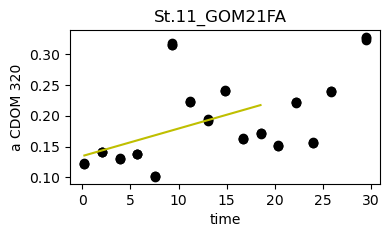

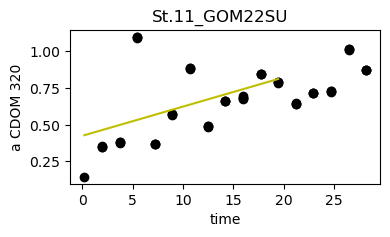

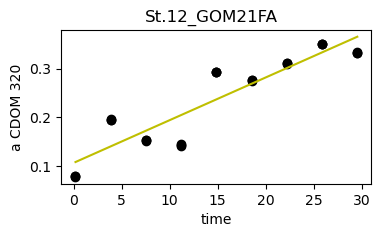

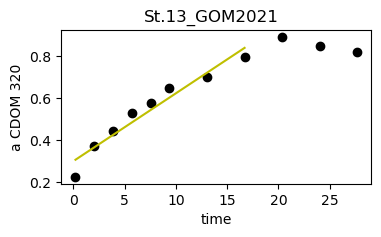

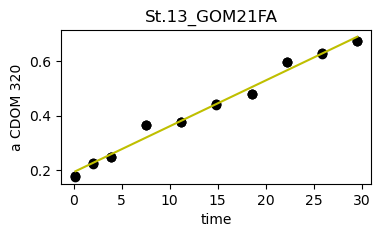

...

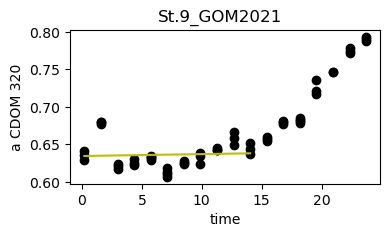

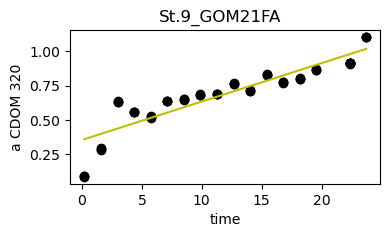

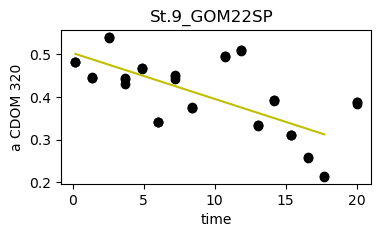

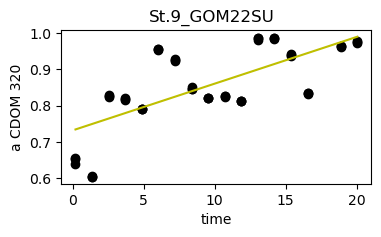

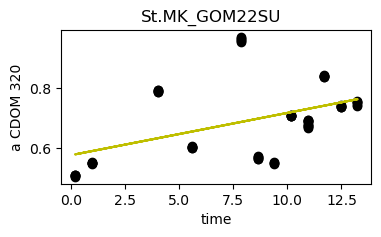

In [20]:
# slopes Calculate 
Frames = []

def cdom_bc_cal(code, time): 
    ds = df_cdom[df_cdom['code'] == code]

    ds_cut = ds[ds['BC_time'] <= time]
    
    x = ds_cut['BC_time'].ravel()
    y = ds_cut['a320'].ravel()
    
    # Calculate the slope of the regression line
    if len(x) > 1:
        slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    
        # Add the slope value to the plot
        slope = slope
        rsquared = r_value**2
        std_err = std_err
    
        dic = {'code':[code],
               'slope_320':[slope],
               'rsquared_320':[rsquared], 
               'std_err_320':[std_err]}
    
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)

        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(4, 2)) 
        axs.plot(x, intercept + slope * x, c='y')     
        axs.scatter(ds['BC_time'], ds['a320'], c="black")
        axs.set_ylabel('a CDOM 320')
        axs.set_xlabel('time')
        fig.suptitle(code)
        #axs.set_ylim(15,-1)
        #axs.set_xlim(df_cdom['a350'].min(),sub['a350'].max()*1.1)
    
        Frames.append(slopes)

cdom_bc_cal('St.11_GOM21FA', 20)
cdom_bc_cal('St.11_GOM22SU', 20)
cdom_bc_cal('St.12_GOM21FA', 30)
cdom_bc_cal('St.13_GOM2021', 20)
cdom_bc_cal('St.13_GOM21FA', 30)
cdom_bc_cal('St.13_GOM22SU', 20)
cdom_bc_cal('St.14_GOM21FA', 30)
cdom_bc_cal('St.14_GOM22SP', 20)
cdom_bc_cal('St.14_GOM22SU', 25)
cdom_bc_cal('St.15_GOM2021', 24)
cdom_bc_cal('St.15_GOM21FA', 20)
cdom_bc_cal('St.15_GOM22SP', 20)
cdom_bc_cal('St.15_GOM22SU', 33)
cdom_bc_cal('St.16_GOM2021', 20)
cdom_bc_cal('St.16_GOM21FA', 15)
cdom_bc_cal('St.16_GOM22SP', 20)
cdom_bc_cal('St.16_GOM22SU', 16)
cdom_bc_cal('St.2_GOM2021', 25)
cdom_bc_cal('St.2_GOM22SP', 20)
cdom_bc_cal('St.2_GOM22SU', 20)
cdom_bc_cal('St.4_GOM22SP', 16)
cdom_bc_cal('St.4_GOM22SU', 20)
cdom_bc_cal('St.5B_GOM21FA', 14)
cdom_bc_cal('St.5B_GOM22SP', 15)
cdom_bc_cal('St.7_GOM21FA', 10)
cdom_bc_cal('St.7_GOM22SP', 25)
cdom_bc_cal('St.7_GOM22SU', 20)
cdom_bc_cal('St.9_GOM2021', 15)
cdom_bc_cal('St.9_GOM21FA', 27)
cdom_bc_cal('St.9_GOM22SP', 18)
cdom_bc_cal('St.9_GOM22SU', 22)
cdom_bc_cal('St.MK_GOM22SU', 15)



In [21]:
slopes_320 = pd.concat(Frames, axis=0, ignore_index=False)
slopes_320 = slopes_320.dropna()
slopes_320
#filtered_slopes_320 = slopes_320[abs(slopes_320['slope_320']) >= slopes_320['std_err_320']]
#filtered_slopes_320


,slope_320,rsquared_320,std_err_320
code,,,
St.11_GOM21FA,0.004450,0.186143,0.001671
St.11_GOM22SU,0.019920,0.227260,0.006394
St.12_GOM21FA,0.008767,0.831095,0.000790
St.13_GOM2021,0.032281,0.942197,0.003264
St.13_GOM21FA,0.016940,0.984011,0.000408
St.13_GOM22SU,0.036777,0.713469,0.004186
St.14_GOM21FA,0.013730,0.915123,0.000687
St.14_GOM22SP,0.030375,0.887989,0.001591
St.14_GOM22SU,0.016719,0.587014,0.002068


In [22]:
# slopes Calculate 
Frames = []

def cdom_bc_cal(code, time): 
    subset_df = df_cdom[df_cdom['code'] == code]
    subset_df = subset_df.sort_values('BC_time')
    subset_df["a350_norm"] = (subset_df["a350"] - subset_df["a400"]) / (subset_df["a300"] - subset_df["a400"])
    subset_df["a325_norm"] = (subset_df["a325"] - subset_df["a400"]) / (subset_df["a300"] - subset_df["a400"])
    subset_df["a375_norm"] = (subset_df["a375"] - subset_df["a400"]) / (subset_df["a300"] - subset_df["a400"])
    subset_df["a_infelc"] = subset_df["a350_norm"] / ((subset_df["a325_norm"] + subset_df["a375_norm"])/2)

    slope = subset_df["a_infelc"].mean()
    std_err = subset_df["a_infelc"].std() /( np.sqrt((len(subset_df))))

    
    dic = {'code':[code],
           'a_infelc':[slope],
           'std_err_a_infelc':[std_err]}
    
    slopes = pd.DataFrame(dic)
    slopes = slopes.set_index('code', drop=True)
    
    Frames.append(slopes)

cdom_bc_cal('St.11_GOM21FA', 20)
cdom_bc_cal('St.11_GOM22SU', 20)
cdom_bc_cal('St.12_GOM21FA', 30)
cdom_bc_cal('St.13_GOM2021', 20)
cdom_bc_cal('St.13_GOM21FA', 30)
cdom_bc_cal('St.13_GOM22SU', 20)
cdom_bc_cal('St.14_GOM21FA', 30)
cdom_bc_cal('St.14_GOM22SP', 20)
cdom_bc_cal('St.14_GOM22SU', 25)
cdom_bc_cal('St.15_GOM2021', 24)
cdom_bc_cal('St.15_GOM21FA', 20)
cdom_bc_cal('St.15_GOM22SP', 20)
cdom_bc_cal('St.15_GOM22SU', 33)
cdom_bc_cal('St.16_GOM2021', 20)
cdom_bc_cal('St.16_GOM21FA', 15)
cdom_bc_cal('St.16_GOM22SP', 20)
cdom_bc_cal('St.16_GOM22SU', 16)
cdom_bc_cal('St.2_GOM2021', 25)
cdom_bc_cal('St.2_GOM22SP', 20)
cdom_bc_cal('St.2_GOM22SU', 20)
cdom_bc_cal('St.4_GOM22SP', 16)
cdom_bc_cal('St.4_GOM22SU', 20)
cdom_bc_cal('St.5B_GOM21FA', 14)
cdom_bc_cal('St.5B_GOM22SP', 15)
cdom_bc_cal('St.7_GOM21FA', 10)
cdom_bc_cal('St.7_GOM22SP', 25)
cdom_bc_cal('St.7_GOM22SU', 20)
cdom_bc_cal('St.9_GOM2021', 15)
cdom_bc_cal('St.9_GOM21FA', 27)
cdom_bc_cal('St.9_GOM22SP', 18)
cdom_bc_cal('St.9_GOM22SU', 22)
cdom_bc_cal('St.MK_GOM22SU', 15)

slopes_inflec = pd.concat(Frames, axis=0, ignore_index=False)
slopes_inflec = slopes_inflec.dropna()
slopes_inflec

,a_infelc,std_err_a_infelc
code,,
St.11_GOM21FA,0.768286,0.003702
St.11_GOM22SU,0.801469,0.012372
St.12_GOM21FA,0.759286,0.011304
St.13_GOM2021,0.893218,0.009011
St.13_GOM21FA,0.879579,0.011675
St.13_GOM22SU,0.899777,0.011145
St.14_GOM21FA,0.814727,0.006158
St.14_GOM22SP,0.846061,0.002404
St.14_GOM22SU,0.902259,0.003199


In [23]:
df_flux = pd.concat([df_hights, df_lat_lon, slopes_320, slopes_350, slopes_412, slopes_inflec], axis=1, join='outer')
df_flux

,Camp,Stn,Hight_muddy_m,Hight_muddy_error,High_cm_tra,High_cm_tra_error,High_m_tra,High_m_tra_error,Hight_m,Hight_error,...,rsquared_320,std_err_320,slope_350,rsquared_350,std_err_350,slope_412,rsquared_412,std_err_412,a_infelc,std_err_a_infelc
code,,,,,,,,,,,,,,,,,,,,,
St.11_GOM2021,GOM2021,St.11,0.176667,0.012472,NaN,NaN,NaN,NaN,0.176667,0.012472,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
St.13_GOM2021,GOM2021,St.13,0.070000,0.000000,7.6,0.20,0.076,0.0020,0.076000,0.002000,...,0.942197,0.003264,0.021192,0.946030,0.002066,0.009504,0.933996,0.001031,0.893218,0.009011
St.14_GOM2021,GOM2021,St.14,NaN,NaN,12.3,0.40,0.123,0.0040,0.123000,0.004000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
St.15_GOM2021,GOM2021,St.15,0.118333,0.015456,9.3,0.30,0.093,0.0030,0.093000,0.003000,...,0.965778,0.001375,0.015916,0.958341,0.000958,0.006690,0.940913,0.000484,0.933425,0.018163
St.16_GOM2021,GOM2021,St.16,0.126667,0.030641,20.4,1.00,0.204,0.0100,0.204000,0.010000,...,0.351029,0.004367,0.010224,0.500772,0.002636,0.008214,0.823146,0.000983,0.819889,0.009157
St.2_GOM2021,GOM2021,St.2,0.115000,0.017678,10.7,0.25,0.107,0.0025,0.107000,0.002500,...,0.931755,0.001793,0.024723,0.952613,0.001300,0.018121,0.968992,0.000764,0.847989,0.005014
St.4_GOM2021,GOM2021,St.4,0.163500,0.021372,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
St.5B_GOM2021,GOM2021,St.5B,0.158750,0.005449,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
St.7_GOM2021,GOM2021,St.7,0.067500,0.022500,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:

df_flux["bc_flux_aCDOM320"] = df_flux["slope_320"] * (df_flux["Hight_m"] *(np.pi*((30/100)**2))) / (np.pi*((30/100)**2)) * 24 
df_flux["bc_flux_aCDOM350"] = df_flux["slope_350"] * (df_flux["Hight_m"]*(np.pi*((30/100)**2))) / (np.pi*((30/100)**2)) * 24 
df_flux["bc_flux_aCDOM412"] = df_flux["slope_412"] * (df_flux["Hight_m"]*(np.pi*((30/100)**2))) / (np.pi*((30/100)**2)) * 24 

df_flux["bc_flux_err_aCDOM320"] = (df_flux["bc_flux_aCDOM320"]* (df_flux["std_err_320"] / df_flux["slope_320"]) * ( df_flux["Hight_m"]* (df_flux["Hight_error"] / df_flux["Hight_m"])) *(np.pi*((30/100)**2))) / (np.pi*((30/100)**2)) * 24 
df_flux["bc_flux_err_aCDOM350"] = (df_flux["bc_flux_aCDOM350"]* (df_flux["std_err_350"] / df_flux["slope_350"]) * ( df_flux["Hight_m"]* (df_flux["Hight_error"] / df_flux["Hight_m"])) *(np.pi*((30/100)**2))) / (np.pi*((30/100)**2)) * 24 
df_flux["bc_flux_err_aCDOM412"] = (df_flux["bc_flux_aCDOM412"]* (df_flux["std_err_412"] / df_flux["slope_412"]) * ( df_flux["Hight_m"]* (df_flux["Hight_error"] / df_flux["Hight_m"])) *(np.pi*((30/100)**2))) / (np.pi*((30/100)**2)) * 24 


df_flux = df_flux[df_flux['slope_320'] >= 0]
df_flux

#condition = abs(df_flux['bc_flux_aCDOM320']) < abs(df_flux['bc_flux_err_aCDOM320'])
#df_flux.loc[condition, 'bc_flux_aCDOM320'] = np.nan

#condition = abs(df_flux['bc_flux_aCDOM350']) < abs(df_flux['bc_flux_err_aCDOM350'])
#df_flux.loc[condition, 'bc_flux_aCDOM350'] = np.nan

#condition = abs(df_flux['bc_flux_aCDOM412']) < abs(df_flux['bc_flux_err_aCDOM412'])
#df_flux.loc[condition, 'bc_flux_aCDOM412'] = np.nan

df_flux.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_cdom_bc.csv')

df_flux

,Camp,Stn,Hight_muddy_m,Hight_muddy_error,High_cm_tra,High_cm_tra_error,High_m_tra,High_m_tra_error,Hight_m,Hight_error,...,rsquared_412,std_err_412,a_infelc,std_err_a_infelc,bc_flux_aCDOM320,bc_flux_aCDOM350,bc_flux_aCDOM412,bc_flux_err_aCDOM320,bc_flux_err_aCDOM350,bc_flux_err_aCDOM412
code,,,,,,,,,,,,,,,,,,,,,
St.13_GOM2021,GOM2021,St.13,0.070000,0.000000,7.6,0.20,0.076,0.0020,0.07600,0.002000,...,0.933996,0.001031,0.893218,0.009011,0.058880,0.038655,0.017335,0.000286,0.000181,0.000090
St.15_GOM2021,GOM2021,St.15,0.118333,0.015456,9.3,0.30,0.093,0.0030,0.09300,0.003000,...,0.940913,0.000484,0.933425,0.018163,0.056464,0.035525,0.014932,0.000221,0.000154,0.000078
St.16_GOM2021,GOM2021,St.16,0.126667,0.030641,20.4,1.00,0.204,0.0100,0.20400,0.010000,...,0.823146,0.000983,0.819889,0.009157,0.060896,0.050057,0.040216,0.005131,0.003097,0.001155
St.2_GOM2021,GOM2021,St.2,0.115000,0.017678,10.7,0.25,0.107,0.0025,0.10700,0.002500,...,0.968992,0.000764,0.847989,0.005014,0.072190,0.063489,0.046536,0.000276,0.000200,0.000118
St.9_GOM2021,GOM2021,St.9,0.071250,0.023816,21.7,1.10,0.217,0.0110,0.21700,0.011000,...,0.450080,0.000278,0.929195,0.006612,0.001339,0.009378,0.007525,0.001031,0.001237,0.000382
St.11_GOM21FA,GOM21FA,St.11,0.233333,0.008498,22.7,1.00,0.227,0.0100,0.22700,0.010000,...,0.814402,0.000285,0.768286,0.003702,0.024244,-0.000284,-0.018123,0.002185,0.000894,0.000373
St.12_GOM21FA,GOM21FA,St.12,0.145000,0.008165,20.5,0.50,0.205,0.0050,0.20500,0.005000,...,0.596270,0.000371,0.759286,0.011304,0.043134,0.027128,0.011078,0.000467,0.000347,0.000219
St.13_GOM21FA,GOM21FA,St.13,0.133333,0.008498,8.8,0.20,0.088,0.0020,0.08800,0.002000,...,0.955875,0.000176,0.879579,0.011675,0.035778,0.024663,0.009168,0.000041,0.000031,0.000018
St.14_GOM21FA,GOM21FA,St.14,0.158333,0.030641,19.3,3.20,0.193,0.0320,0.19300,0.032000,...,0.914908,0.000143,0.814727,0.006158,0.063596,0.038986,0.013243,0.002445,0.001434,0.000510
